In [1]:
import json
from typing import List

import numpy as np
import pandas as pd
from tqdm.notebook import tqdm
from rich import print
import matplotlib.pyplot as plt

from src.blip_modules.blip_text_encoder import BLIPTextEncoder
from src.blip_modules.blip_img_encoder import BLIPImgEncoder
from src.data_utils import targetpad_transform
from src.cirr_experiment.utils import element_wise_sum_original, get_combing_function_with_alpha, \
    convert_to_pivot_cirr, prepare_and_plot_recall_pivot, prepare_ground_truths, plot_retrieval_results_of_i, \
    found_better_than_original
from src.cirr_experiment.validate_notebook import cirr_val_retrieval_text_image_grid_search, compute_results_cirr_val
from src.utils import device

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 1: Set up the experiment</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Set up the cache for the experiment</div>

In [2]:
cache = {}

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Same concept as script version here</div>

In [3]:
BLIP_PRETRAINED_PATH = '../../../models/model_base_retrieval_flickr.pth'
MED_CONFIG_PATH = '../../blip_modules/med_config.json'

In [4]:
blip_text_encoder = BLIPTextEncoder(
    BLIP_PRETRAINED_PATH, 
    MED_CONFIG_PATH,
    use_pretrained_proj_layer=True
)

blip_text_encoder = blip_text_encoder.to(device)
print("blip text encoder loaded.")
blip_text_encoder.eval()

load checkpoint from ../../../models/model_base_retrieval_flickr.pth for text_encoder.
load checkpoint from ../../../models/model_base_retrieval_flickr.pth for text_proj.


blip text encoder loaded.

BLIPTextEncoder(
  (text_encoder): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(30524, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0-11): 12 x BertLayer(
          (attention): BertAttention(
            (self): BertSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
              (dropout): Drop

In [5]:
blip_img_encoder = BLIPImgEncoder(BLIP_PRETRAINED_PATH)
blip_img_encoder = blip_img_encoder.to(device)
print("blip img encoder loaded.")
blip_img_encoder.eval()

load checkpoint from ../../../models/model_base_retrieval_flickr.pth for visual_encoder.
load checkpoint from ../../../models/model_base_retrieval_flickr.pth for vision_proj.


blip img encoder loaded.

BLIPImgEncoder(
  (visual_encoder): VisionTransformer(
    (patch_embed): PatchEmbed(
      (proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
      (norm): Identity()
    )
    (pos_drop): Dropout(p=0.0, inplace=False)
    (blocks): ModuleList(
      (0-11): 12 x Block(
        (norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (attn): Attention(
          (qkv): Linear(in_features=768, out_features=2304, bias=True)
          (attn_drop): Dropout(p=0.0, inplace=False)
          (proj): Linear(in_features=768, out_features=768, bias=True)
          (proj_drop): Dropout(p=0.0, inplace=False)
        )
        (drop_path): Identity()
        (norm2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (mlp): Mlp(
          (fc1): Linear(in_features=768, out_features=3072, bias=True)
          (act): GELU(approximate='none')
          (fc2): Linear(in_features=3072, out_features=768, bias=True)
          (drop): Dropout(p=0.0, inplace=False)
      

In [6]:
print('Target pad preprocess pipeline is used')
preprocess = targetpad_transform(1.25, 384)

Target pad preprocess pipeline is used

In [7]:
combining_function_original = element_wise_sum_original

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 2: Load the MLLM generated text captions</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Load the addition text captions</div>

In [8]:
with open('../../../cirr_dataset/cirr_labeled_images_cir_cleaned.json', 'r') as f:
    text_captions = json.load(f)
    
print(f'Total number of text captions: {len(text_captions)}')

Total number of text captions: 4609

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 3: Perform retrieval on the CIRR dataset</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Perform retrieval</div>

In [9]:
grid_search_alphas = np.arange(0, 1.05, 0.05)
total_result: List[pd.DataFrame] = []

for alpha in tqdm(grid_search_alphas, desc="Grid Search alphas and betas"):
    result = cirr_val_retrieval_text_image_grid_search(
        get_combing_function_with_alpha(alpha),
        blip_text_encoder,
        blip_img_encoder,
        text_captions,
        preprocess,
        cache=cache,
    )
    
    total_result.append(result)

recall_at1, recall_at5, recall_at10, recall_at50, group_recall_at1, group_recall_at2, group_recall_at3 = convert_to_pivot_cirr(total_result)

Grid Search alphas and betas:   0%|          | 0/21 [00:00<?, ?it/s]

In [10]:
display(recall_at1, recall_at5, recall_at10, recall_at50, group_recall_at1, group_recall_at2, group_recall_at3)

alpha,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
beta,,,,,,,,,,,,,,,,,,,,,
0.00,7.223152,7.342741,7.414494,7.534083,7.605836,7.653672,7.701506,7.797178,7.988519,8.155943,...,8.610380,8.969146,9.423583,9.949773,10.810811,12.652476,15.929204,23.750299,32.575938,30.064577
0.05,7.438412,7.438412,7.558001,7.629754,7.797178,7.988519,8.132026,8.155943,8.275532,8.395121,...,8.945228,9.567089,9.878019,10.595551,11.887109,14.183210,17.914374,26.094237,33.723989,31.140876
0.10,7.414494,7.510165,7.558001,7.749342,7.821096,8.036355,8.179861,8.490792,8.658215,8.849557,...,9.471418,10.069361,10.858646,11.767520,13.202584,15.642191,20.066969,28.175077,34.585029,31.643146
0.15,7.558001,7.605836,7.773260,7.892849,8.132026,8.299450,8.490792,8.586463,8.706051,9.016982,...,10.117197,10.786893,11.839273,12.963405,14.733317,17.459938,22.530495,29.562306,34.537193,31.380051
0.20,7.629754,7.773260,7.988519,8.132026,8.466874,8.514710,8.658215,8.849557,9.280077,9.614924,...,10.810811,11.767520,12.915571,14.398469,16.479312,19.732122,24.204735,29.968908,34.704617,30.949533
0.25,7.486247,7.677589,7.749342,8.012437,8.275532,8.514710,8.777805,9.184406,9.686678,10.236786,...,11.528342,12.819900,14.254963,16.048792,18.033963,20.999761,25.591964,30.112413,33.867496,30.590767
0.30,7.270988,7.390577,7.701506,7.940684,8.179861,8.419038,8.729969,9.160488,9.878019,10.619469,...,12.461134,13.728774,15.283425,17.220761,19.564697,22.697920,26.261660,30.255920,33.078212,29.849318
0.35,6.983975,7.175317,7.462329,7.749342,8.155943,8.466874,8.706051,9.208323,9.997609,10.810811,...,13.298254,14.805071,16.264051,18.297058,20.951925,24.037312,27.003109,30.590767,32.336763,29.251376
0.40,6.840469,7.055728,7.414494,7.629754,7.964602,8.275532,8.610380,8.993064,9.925855,11.049988,...,13.776608,15.259507,16.790241,19.373356,22.052141,24.539584,27.457547,30.423343,31.332219,28.677350


alpha,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
beta,,,,,,,,,,,,,,,,,,,,,
0.00,25.304952,25.448456,25.591964,25.783306,26.046401,26.429084,26.835686,27.146617,27.696723,28.222913,...,29.347047,30.232003,31.451806,33.747908,36.115763,40.157858,46.902654,57.139438,64.027745,57.713467
0.05,25.783306,26.094237,26.453000,26.763931,26.979190,27.242288,27.648887,28.438172,29.155704,29.873237,...,31.212628,32.217172,33.556566,35.733077,38.818464,43.123654,50.179380,59.220284,65.367138,58.598423
0.10,26.620427,26.907438,27.242288,27.720642,27.888066,28.486007,28.988281,29.610142,30.375507,31.093040,...,32.815117,34.082755,35.685244,38.531452,41.808179,46.161205,52.690744,60.655344,65.749818,58.765846
0.15,26.476920,27.050945,27.672806,28.055489,28.462091,29.012197,29.849318,30.255920,31.093040,32.121503,...,34.058839,35.804832,38.292274,40.947142,44.582635,49.150920,55.345613,62.233913,65.582395,58.694094
0.20,26.046401,26.644343,27.098781,27.864146,28.533843,28.988281,29.992825,30.949533,31.667066,32.958624,...,35.900503,37.670413,40.014350,43.530256,47.117916,51.614445,56.828511,62.425256,64.649606,58.120066
0.25,25.855058,26.357332,26.979190,27.553216,28.366420,29.060033,30.279836,31.236547,32.647693,34.178427,...,37.239894,39.583832,42.262617,45.611098,49.198756,53.336525,58.096147,62.066489,63.621145,57.354701
0.30,25.424540,26.046401,26.644343,27.385792,28.222913,29.370964,30.542931,32.001913,33.580482,35.015547,...,38.938054,41.186318,44.056445,47.309256,50.801241,54.628080,58.407080,61.420715,62.162161,56.565416
0.35,25.233197,26.046401,26.620427,27.290121,28.366420,29.753646,30.973452,32.504186,34.298015,36.020091,...,40.086102,42.764890,46.017700,49.031332,51.997131,55.369526,58.311409,60.870606,60.751015,55.369526
0.40,25.113609,25.831142,26.357332,27.266204,28.318584,29.705811,31.188712,32.743362,34.752452,36.665869,...,41.066730,44.534799,47.237504,50.131547,53.312606,55.895716,58.287489,59.794307,59.339869,54.173642


alpha,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
beta,,,,,,,,,,,,,,,,,,,,,
0.00,36.259267,36.474529,36.641952,36.857212,36.976799,37.431237,37.790003,38.268358,38.770628,39.703420,...,41.688591,42.836642,44.534799,46.711314,50.275052,54.747671,61.612052,69.480985,75.819182,68.428606
0.05,37.000719,37.335566,37.622577,37.885672,38.196602,38.890219,39.559913,40.205693,40.994978,41.927770,...,44.080365,45.587179,47.452763,50.203300,54.006219,58.431000,64.625686,71.705335,76.560634,69.170058
0.10,37.311649,37.670413,38.172686,38.722792,39.272901,39.751256,40.516624,41.640756,42.597464,43.745515,...,46.591726,48.409471,50.825161,53.384358,57.043767,61.038029,66.873956,73.570913,76.728058,69.480985
0.15,37.670413,38.268358,38.818464,39.344653,40.062186,40.779719,41.832098,42.812723,43.960774,45.300168,...,48.959580,51.136094,53.312606,56.469744,59.889978,63.549387,68.643868,74.240613,76.751971,69.241810
0.20,37.574744,38.316193,39.129394,39.823008,40.492705,41.377661,42.310452,43.625927,44.845730,46.854821,...,50.992584,53.575701,56.326240,59.076774,61.875147,65.845490,70.102847,74.408036,76.393205,68.906963
0.25,37.455153,38.196602,39.057642,39.799091,41.042814,41.903850,43.123654,44.582635,46.615642,48.839989,...,52.858168,55.728292,58.478832,61.348957,63.836402,67.089212,71.107394,74.192774,75.508249,68.548197
0.30,37.024635,38.029179,38.842383,39.990434,41.138485,42.573547,43.841186,45.874193,47.978953,49.940205,...,54.651999,57.569957,60.440087,62.664437,65.271467,67.950249,71.370488,74.049270,74.623299,67.830664
0.35,36.522362,37.311649,38.435781,39.655584,40.851471,42.525712,44.582635,46.687394,48.744321,50.825161,...,55.943555,58.909351,61.659890,63.955992,66.443437,68.572110,71.155226,73.403490,73.259985,66.586941
0.40,36.402774,37.072471,38.411865,39.368573,41.066730,42.812723,44.965318,46.783066,49.342263,51.925379,...,56.948102,59.842145,62.592679,65.032291,66.993541,68.930876,70.676869,72.064102,71.179146,65.534562


alpha,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
beta,,,,,,,,,,,,,,,,,,,,,
0.00,61.157620,61.755562,61.994737,62.401336,62.831861,63.597226,64.243007,64.888781,65.773737,66.634774,...,69.337481,71.155226,73.259985,75.388664,78.378379,82.253051,86.462569,90.241569,91.844058,85.553694
0.05,63.286293,63.812482,64.338672,64.936620,65.510643,66.204256,67.184883,68.069839,69.146138,70.222437,...,72.877300,74.814636,76.656300,78.713226,81.463766,84.644824,88.399905,91.222197,92.226738,86.175555
0.10,64.649606,65.391058,65.917248,66.706532,67.687154,68.428606,69.528818,70.700788,71.848840,73.092562,...,75.843102,77.732599,79.478592,81.607270,84.022963,86.653912,89.691460,91.963643,92.561591,86.629993
0.15,65.510643,66.180342,67.065293,68.165511,69.313562,70.413774,71.513993,72.685963,74.168861,75.316912,...,78.282708,79.861277,81.631190,83.640277,86.055970,88.280314,90.719926,92.418081,92.561591,86.701745
0.20,65.893328,66.706532,67.878497,69.074386,70.437694,71.801007,72.877300,74.479789,75.771344,77.110738,...,80.435300,81.966037,83.544606,85.625446,87.467110,89.571875,91.461372,92.633343,92.394161,86.797416
0.25,66.156423,67.256635,68.356854,69.863671,71.035635,72.566372,74.240613,75.795263,77.158576,79.000241,...,82.205212,83.664197,85.338438,86.988759,88.543409,90.121979,91.628796,92.633343,92.035401,86.869168
0.30,65.941161,67.400146,68.787372,70.246351,71.537912,73.092562,75.029898,76.656300,78.761059,80.435300,...,83.377182,85.003591,86.414731,87.801963,89.428365,90.696007,91.628796,92.705095,91.676635,86.773497
0.35,65.630233,67.065293,68.739533,70.294189,71.992344,73.881847,75.580007,77.541256,79.598182,81.296343,...,84.453481,85.792875,87.156183,88.423824,89.763212,90.791678,91.604877,92.298496,91.246116,86.366898
0.40,64.936620,66.754365,68.548197,70.246351,72.159773,74.049270,76.177949,78.187037,79.980868,81.846446,...,85.003591,86.462569,87.706292,88.734752,89.715379,90.815592,91.485292,91.891891,90.815592,86.008132


alpha,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
beta,,,,,,,,,,,,,,,,,,,,,
0.00,20.975843,21.119349,21.334609,21.502033,21.741210,21.980387,22.219564,22.650084,23.032767,23.391533,...,25.041857,25.950730,27.074862,28.796938,31.164792,35.326478,41.425496,51.016504,64.051664,70.748627
0.05,21.238938,21.406361,21.693374,21.956469,22.267400,22.554412,23.032767,23.487204,24.085148,24.898350,...,26.476920,27.409711,28.509927,30.758193,33.676153,37.718248,43.865106,53.551781,64.434344,71.131307
0.10,21.119349,21.645540,21.884717,22.458743,22.745755,23.128438,23.798135,24.491748,25.209281,26.070318,...,27.864146,29.418799,30.877781,32.910788,35.780913,40.277445,46.376464,56.087059,65.630233,71.274817
0.15,20.904090,21.310692,21.812963,22.339153,23.056684,23.678546,24.635255,25.352785,26.309496,27.266204,...,29.753646,31.308299,33.149964,35.374314,38.005263,42.621383,49.055248,57.761300,66.252095,71.394402
0.20,20.951925,21.478115,22.052141,22.769672,23.535040,24.419995,25.137526,26.357332,27.577135,28.390336,...,31.547478,33.293471,35.039464,37.431237,40.636212,45.348004,50.705570,58.981103,67.065293,71.298730
0.25,20.832337,21.525951,22.052141,22.961015,23.822053,24.802679,26.070318,27.361876,28.414255,29.777566,...,33.436978,35.135135,37.168142,39.799091,43.291080,46.974409,52.571154,59.937817,67.256635,71.226978
0.30,21.023679,21.573786,22.482659,23.295863,24.396077,25.233197,26.405168,27.911982,29.442716,31.093040,...,34.632862,36.976799,39.320737,42.023438,45.204496,49.222675,53.862715,60.846686,67.424059,70.700788
0.35,20.975843,21.789046,22.626166,23.606792,24.563502,25.687635,26.955274,28.366420,30.375507,32.552022,...,36.474529,38.531452,40.994978,44.008610,47.046161,51.016504,55.441284,61.277205,67.687154,70.246351
0.40,20.688830,21.669456,22.721837,23.750299,24.874432,26.142073,27.792394,29.538387,31.595314,33.317387,...,37.407318,39.966515,42.621383,45.611098,48.720402,52.523321,56.565416,61.564219,67.137051,69.624490


alpha,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
beta,,,,,,,,,,,,,,,,,,,,,
0.00,41.927770,42.143029,42.453960,42.932314,43.291080,43.602008,43.889022,44.510883,45.156661,46.041617,...,48.026788,49.318346,50.657737,53.336525,56.613249,60.870606,66.204256,73.905766,81.774694,86.032051
0.05,41.975603,42.597464,43.051901,43.410668,43.912938,44.606555,45.228416,46.041617,46.711314,47.835445,...,50.227219,51.566613,53.790957,55.919635,59.339869,63.310212,69.217891,75.771344,82.635731,86.462569
0.10,41.903850,42.621383,43.482420,44.152117,45.108825,45.922029,46.759149,47.572351,48.816073,49.677110,...,52.403730,54.412818,56.493664,59.005022,62.281752,65.845490,71.035635,76.991153,83.066255,86.749583
0.15,41.688591,42.717054,43.458503,44.439128,45.515427,46.543890,47.978953,48.959580,50.227219,51.757956,...,55.345613,57.019854,59.005022,61.827314,64.530015,68.356854,72.805548,77.780437,83.520687,86.606073
0.20,42.214781,42.884478,43.936858,44.845730,46.376464,47.715858,48.792154,50.275052,51.710117,53.503948,...,57.067686,59.244198,61.229372,63.932073,66.634774,70.078927,74.049270,78.617555,83.735949,86.534321
0.25,42.453960,43.673763,44.367376,45.395839,46.830902,48.457307,49.629274,51.183927,52.977759,54.723752,...,58.909351,60.966277,63.453722,65.654153,68.452525,71.442240,75.005978,79.430759,83.855540,86.199474
0.30,42.382205,43.673763,44.989237,46.328628,47.428843,49.031332,50.777328,52.355897,54.364985,56.182730,...,60.487920,62.640518,65.008372,67.519730,69.768000,72.805548,76.034439,80.172205,83.903372,85.960299
0.35,42.334369,43.769434,44.965318,46.543890,47.907200,49.772781,51.781869,53.456110,55.441284,57.689548,...,61.994737,64.601767,66.706532,68.883044,71.298730,73.762256,77.254248,80.985409,84.142548,85.888541
0.40,42.310452,43.649843,45.084909,46.854821,48.576894,50.729489,52.642906,54.484576,56.732839,58.741927,...,63.310212,65.534562,67.926335,70.222437,72.111934,74.886394,77.900022,81.176752,83.903372,85.745037


alpha,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
beta,,,,,,,,,,,,,,,,,,,,,
0.00,61.922985,62.114328,62.497008,62.807941,63.334131,63.884240,64.362592,64.840949,65.462810,66.252095,...,68.619949,69.863671,71.370488,73.403490,75.460416,78.210956,81.822532,86.797416,90.815592,92.992109
0.05,61.922985,62.305671,62.784022,63.166708,63.764650,64.506102,65.271467,66.036832,67.232722,68.285102,...,70.605117,71.777087,73.307818,75.101650,77.134657,80.148292,83.640277,87.682372,91.293949,93.255204
0.10,62.281752,62.879694,63.405883,64.027745,64.912701,65.510643,66.515189,67.471898,68.667781,69.768000,...,71.992344,73.331738,74.958146,76.847643,79.119825,81.726861,84.740496,88.232481,91.652715,93.398708
0.15,62.162161,62.951446,63.884240,64.625686,65.462810,66.539103,67.471898,68.643868,69.911504,71.250898,...,73.427409,75.221241,77.062905,78.545803,80.530971,83.209759,85.721117,88.997847,91.963643,93.637884
0.20,62.233913,63.142788,64.075577,64.912701,66.180342,67.113131,68.524277,69.672328,70.724708,72.398949,...,75.412583,76.728058,78.474051,79.956949,81.894284,84.357810,86.725664,89.332694,92.202824,93.637884
0.25,62.353504,63.453722,64.266920,65.343219,66.586941,68.189430,69.576657,70.676869,72.111934,73.714423,...,76.680219,78.163117,79.717773,81.511599,83.496773,85.410190,87.180102,89.643627,92.370248,93.566132
0.30,62.114328,63.453722,64.314759,65.941161,67.352307,68.739533,70.174599,71.920592,73.427409,75.029898,...,77.947861,79.215497,80.817986,82.731402,84.525234,86.295146,87.969387,90.169817,92.465919,93.326956
0.35,61.875147,63.094956,64.434344,66.012913,67.639321,69.026548,70.748627,72.829467,74.551541,76.154029,...,79.119825,80.507058,82.085627,83.903372,85.386270,86.869168,88.304234,90.313321,92.322409,93.016022
0.40,61.659890,63.118869,64.697438,66.299927,68.141592,69.457066,71.322650,73.236066,75.221241,76.751971,...,80.100453,81.368095,83.401102,84.549153,85.745037,87.204015,88.830423,90.528584,92.274576,92.992109


# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 4: Plot the result</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Configure the plot style</div>

In [11]:
plt.style.use('seaborn-whitegrid')
pd.options.display.float_format = '{:.2f}'.format

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the recall results</div>

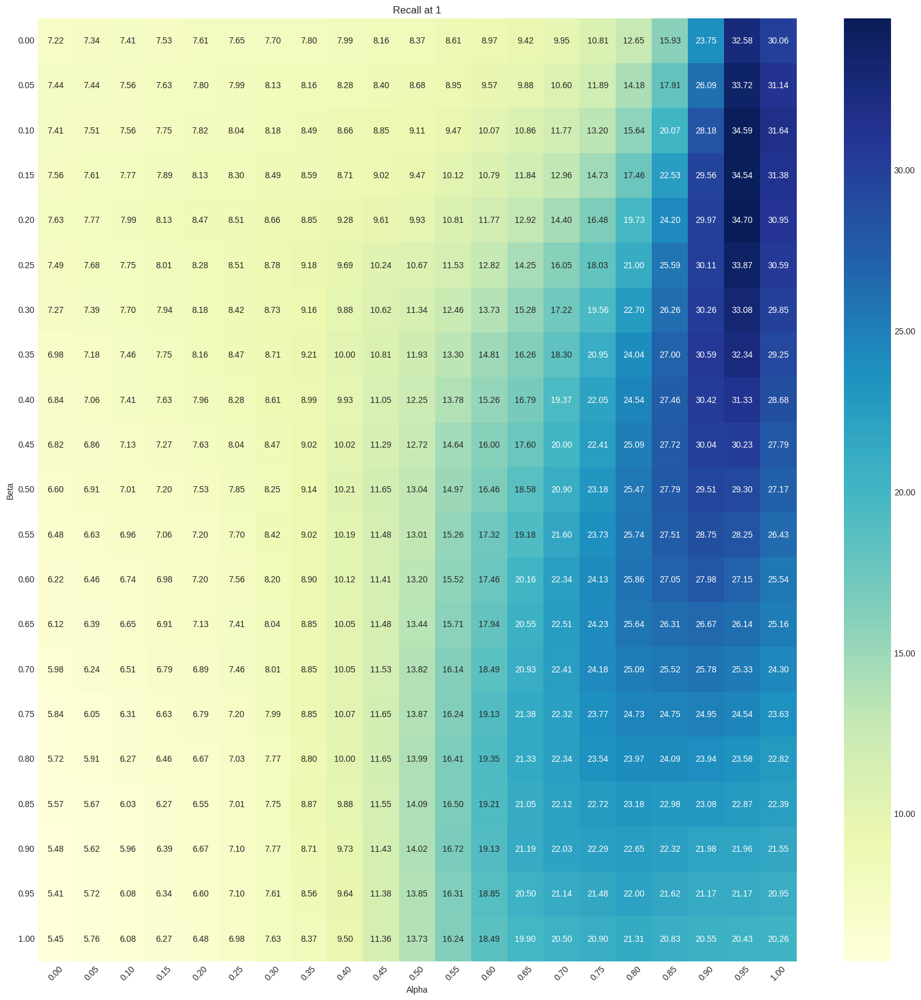

In [12]:
prepare_and_plot_recall_pivot(recall_at1, 'Recall at 1')

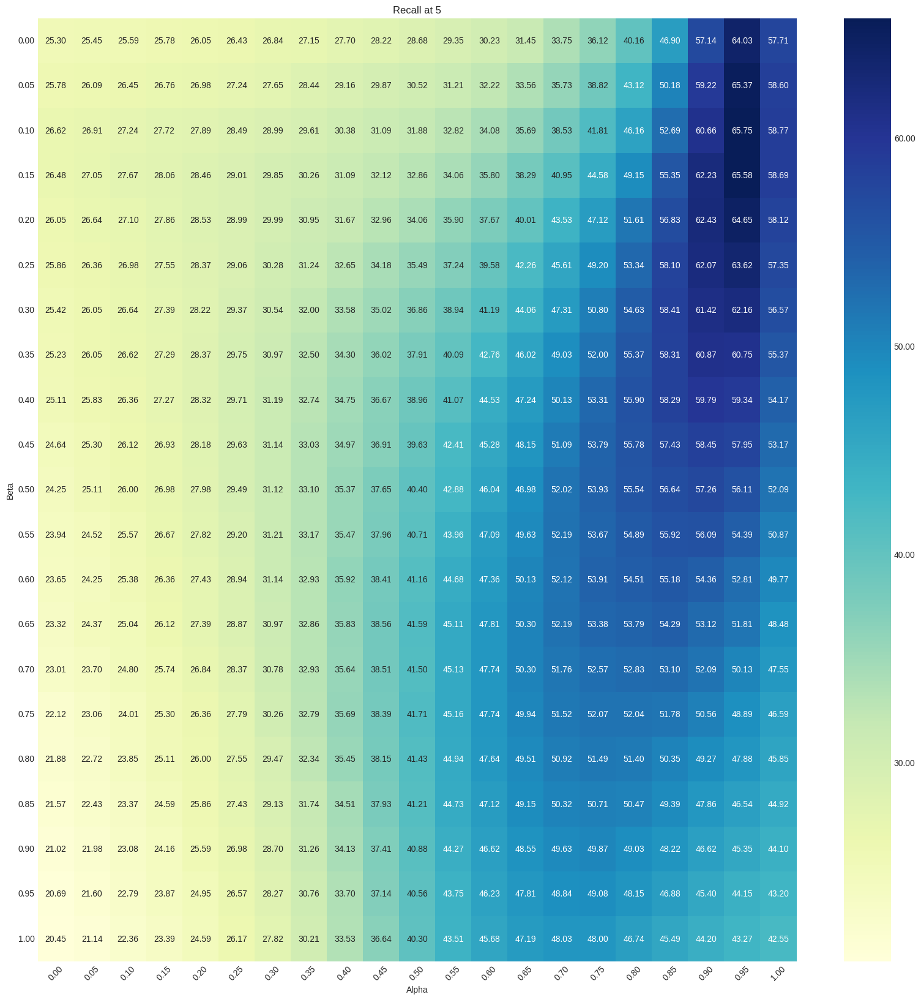

In [13]:
prepare_and_plot_recall_pivot(recall_at5, 'Recall at 5')

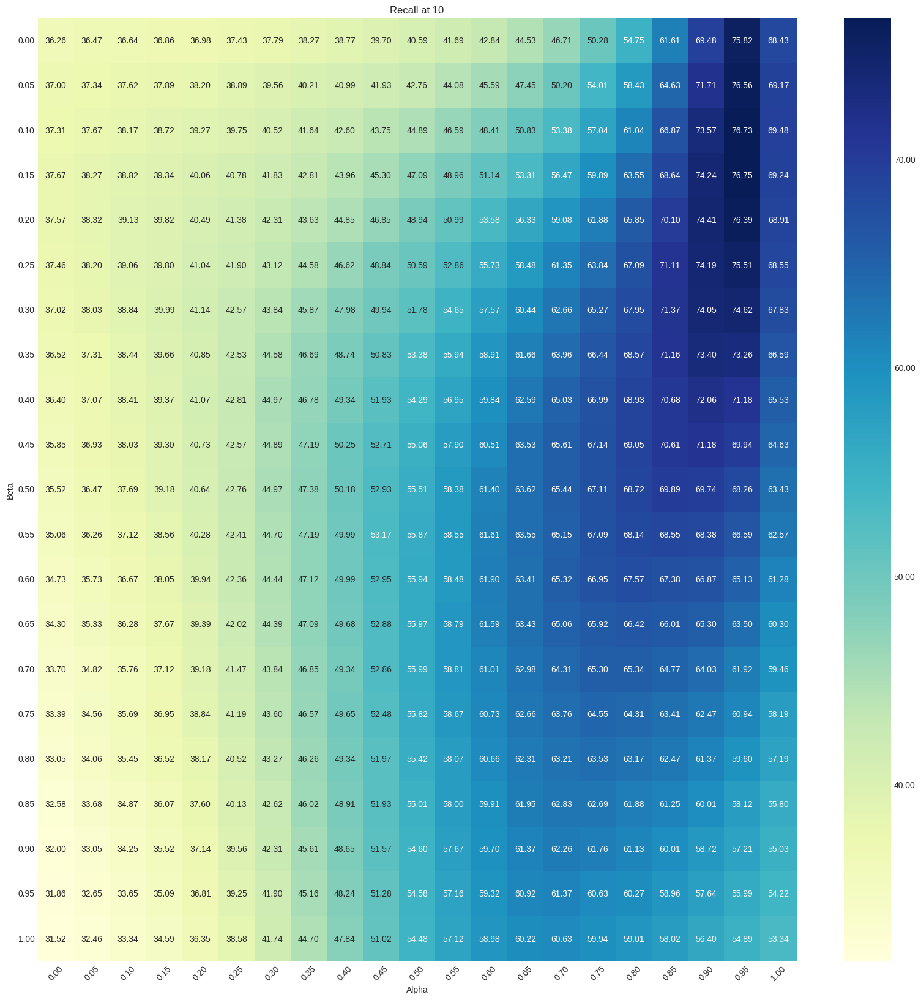

In [14]:
prepare_and_plot_recall_pivot(recall_at10, 'Recall at 10')

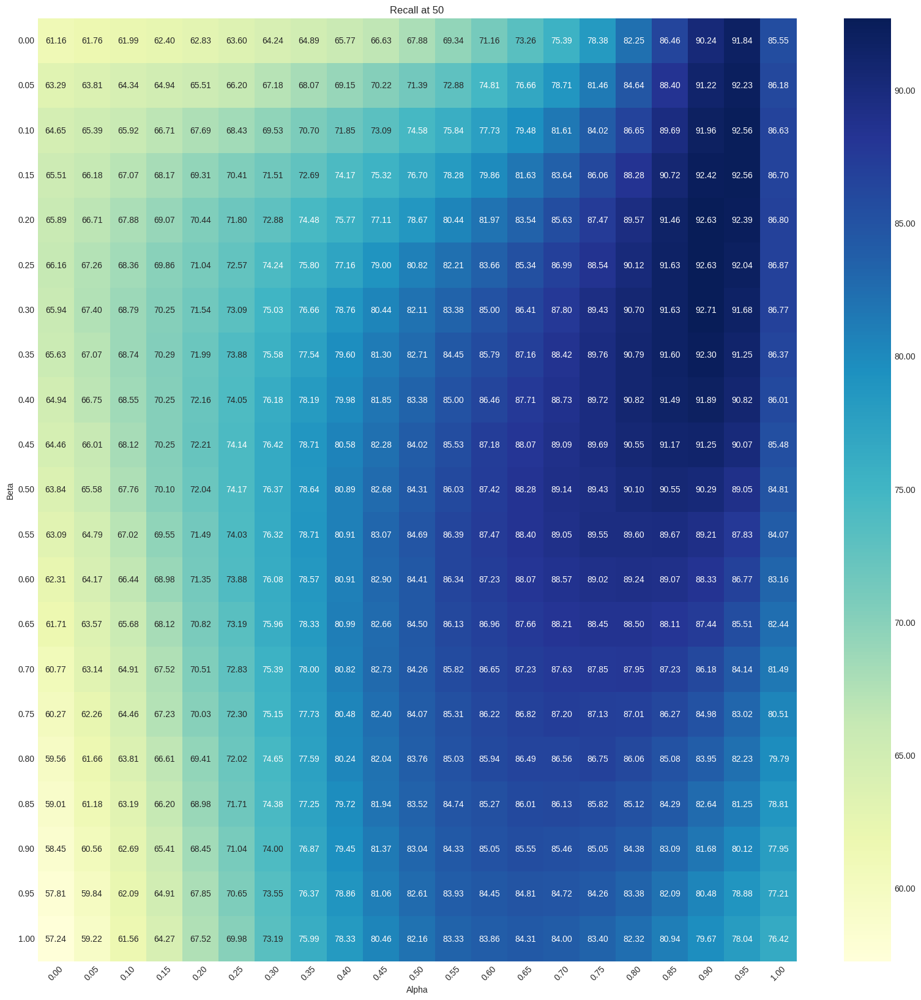

In [15]:
prepare_and_plot_recall_pivot(recall_at50, 'Recall at 50')

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the group recall results</div>

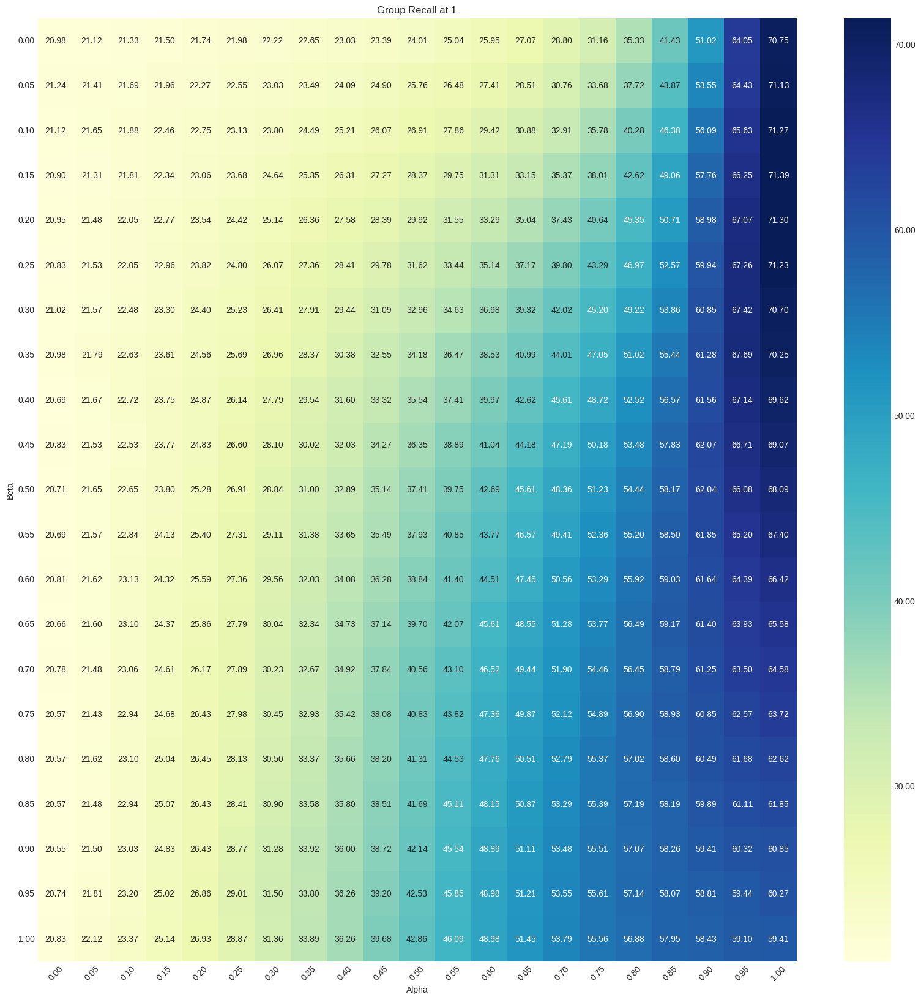

In [16]:
prepare_and_plot_recall_pivot(group_recall_at1, 'Group Recall at 1')

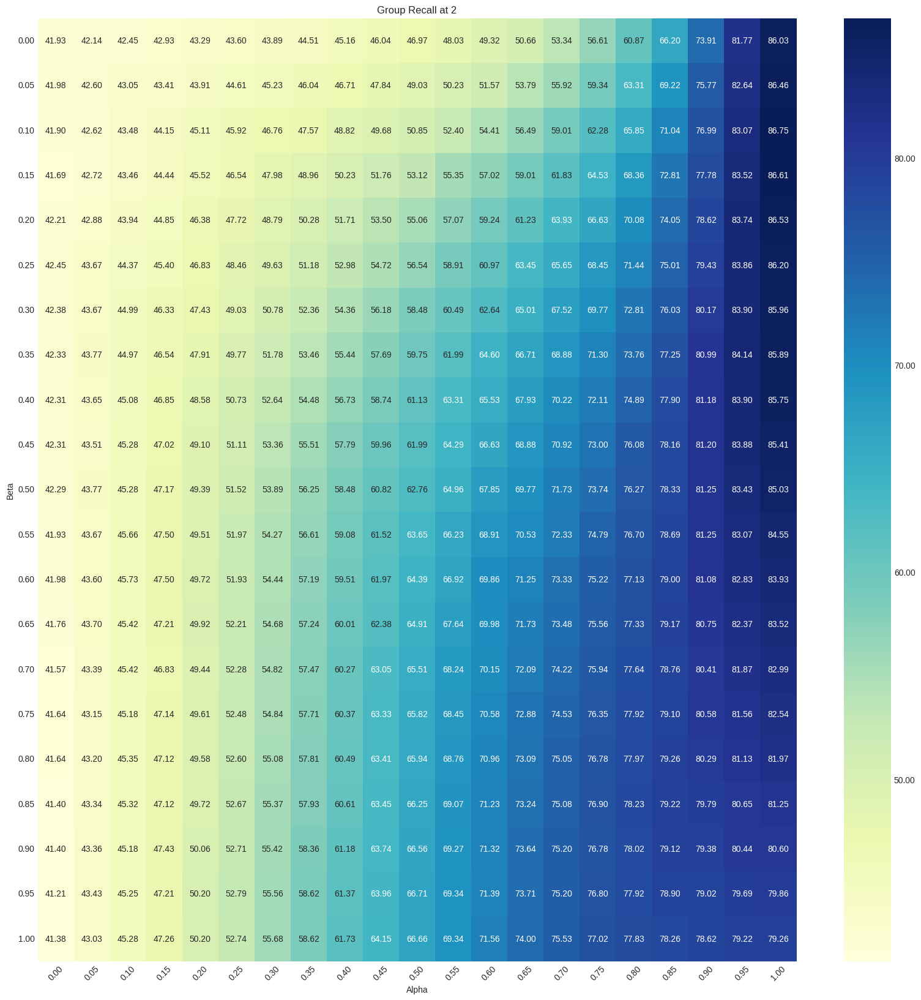

In [17]:
prepare_and_plot_recall_pivot(group_recall_at2, 'Group Recall at 2')

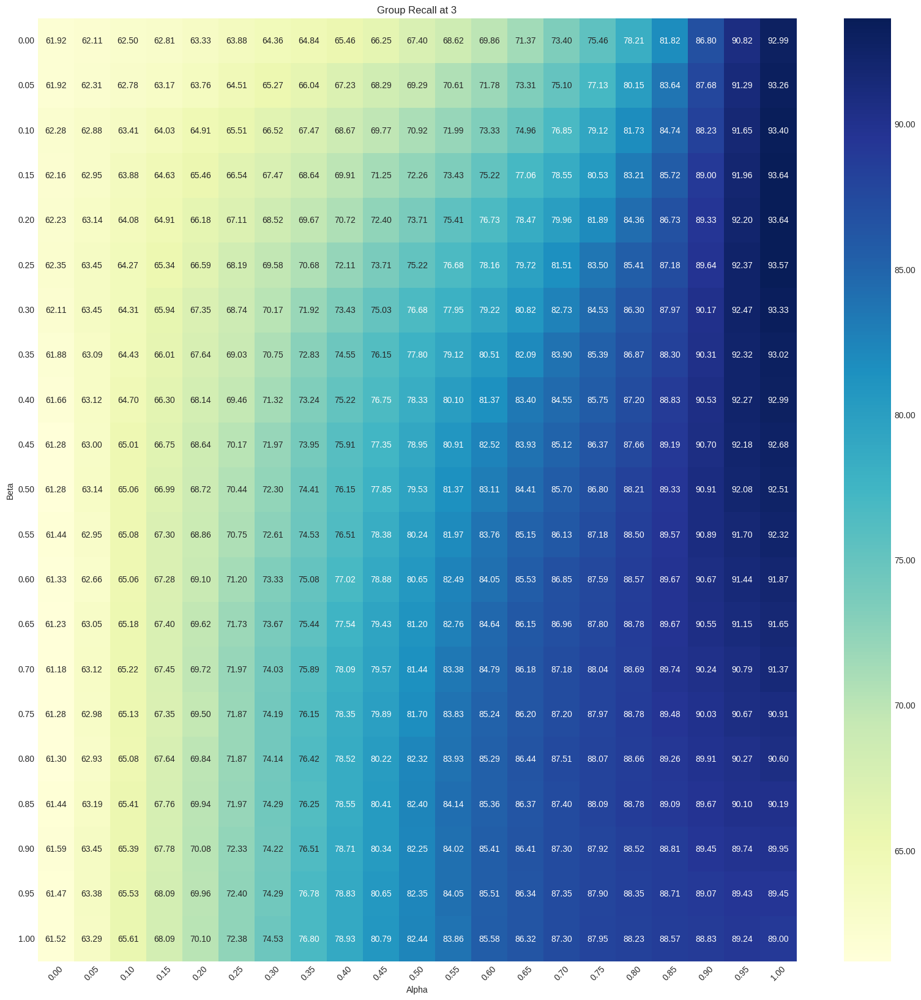

In [18]:
prepare_and_plot_recall_pivot(group_recall_at3, 'Group Recall at 3')

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 5: View some sample of the result</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the results</div>

In [19]:
sorted_indices, image_index_names, target_names = compute_results_cirr_val(
    get_combing_function_with_alpha(0.95),
    blip_text_encoder,
    blip_img_encoder,
    text_captions,
    preprocess,
    beta=0.2,
    cache=cache,
)

Recall Results
Recall at 1: 34.70
Recall at 5: 64.65
Recall at 10: 76.39
Recall at 50: 92.39
Group Recall Results
Group Recall at 1: 67.07
Group Recall at 2: 83.74
Group Recall at 3: 92.20


## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Prepare the ground truth data</div>

In [20]:
ground_truth = prepare_ground_truths(json.load(open('../../../cirr_dataset/cirr/captions/cap.rc2.val.json')))

DATASET_IMAGE_DIR = '../../../cirr_dataset/dev/'

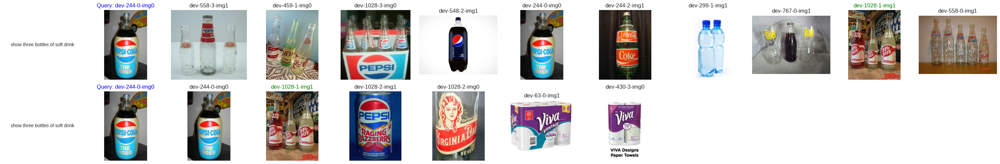

In [21]:
plot_retrieval_results_of_i(
    sorted_indices, 
    image_index_names, 
    target_names, 
    ground_truth, 
    top_k=10, 
    i=0,
    directory=DATASET_IMAGE_DIR,
)

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 6: Compare with the original without MMLM captions and identical weights element-wise sum</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compare the results</div>

In [22]:
sorted_indices_origin, image_index_names_origin, target_names_origin = compute_results_cirr_val(
    combining_function_original,
    blip_text_encoder,
    blip_img_encoder,
    text_captions,
    preprocess,
    beta=0,
    cache=cache,
)

Recall Results
Recall at 1: 8.37
Recall at 5: 28.68
Recall at 10: 40.59
Recall at 50: 67.88
Group Recall Results
Group Recall at 1: 24.01
Group Recall at 2: 46.97
Group Recall at 3: 67.40


## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compare the results</div>

In [23]:
become_better = found_better_than_original(
    sorted_indices_origin, image_index_names_origin, target_names_origin,
    sorted_indices, image_index_names, target_names,
    top_k=10
)

len(become_better), become_better[:10]

(1685, [0, 2, 6, 14, 15, 18, 19, 23, 25, 29])

In [24]:
become_worse = found_better_than_original(
    sorted_indices, image_index_names, target_names,
    sorted_indices_origin, image_index_names_origin, target_names_origin,
    top_k=10
)

len(become_worse), become_worse[:10]

(186, [4, 24, 44, 65, 87, 98, 201, 252, 288, 304])

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 7: Visualize the comparison</div>

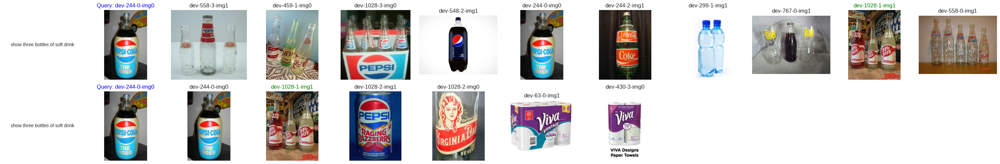

In [25]:
plot_retrieval_results_of_i(sorted_indices, image_index_names, target_names, ground_truth, top_k=10, i=0)

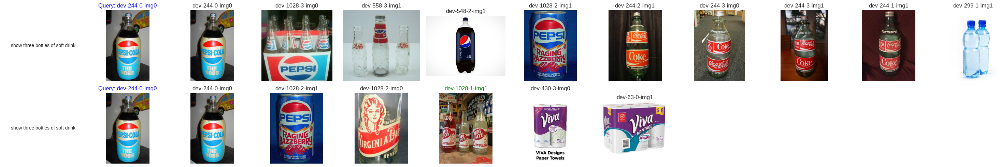

In [26]:
plot_retrieval_results_of_i(sorted_indices_origin, image_index_names_origin, target_names_origin, ground_truth, top_k=10, i=0)

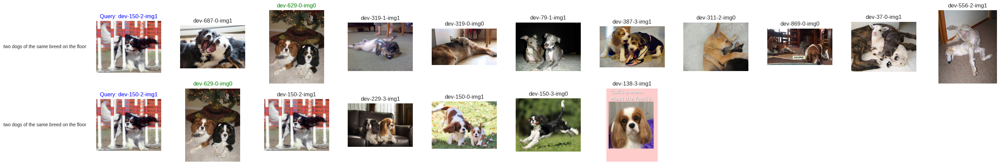

In [27]:
plot_retrieval_results_of_i(sorted_indices, image_index_names, target_names, ground_truth, top_k=10, i=6)

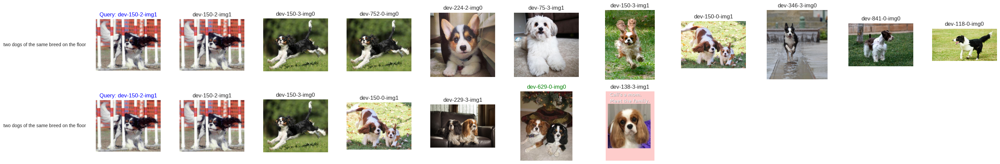

In [28]:
plot_retrieval_results_of_i(sorted_indices_origin, image_index_names_origin, target_names_origin, ground_truth, top_k=10, i=6)

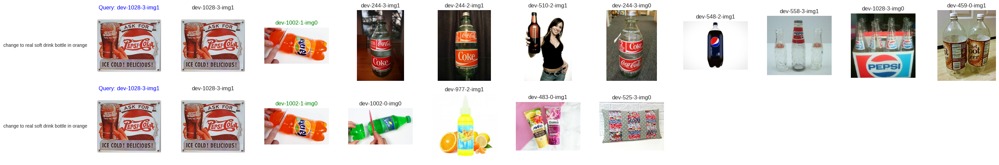

In [29]:
plot_retrieval_results_of_i(sorted_indices, image_index_names, target_names, ground_truth, top_k=10, i=19)

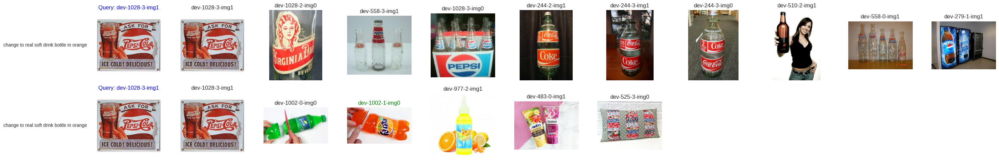

In [30]:
plot_retrieval_results_of_i(sorted_indices_origin, image_index_names_origin, target_names_origin, ground_truth, top_k=10, i=19)